
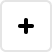
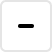
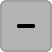
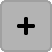
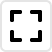
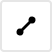
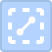

In [1]:
import geopandas as gpd
from lets_plot import *
LetsPlot.setup_html()

In [2]:
from lets_plot import *
from lets_plot.geo_data import *

# %%

offices = [
    ["Prague", "CZ", "Headquarters", 100],
    ["Petersburg", "Russia", "R&D Center", 1000],
    ["Moscow", "Russia", "R&D Center", 100],
    ["Novosibirsk", "Russia", "R&D Center", 50],
    ["München", "Germany", "R&D Center", 200],
    ["Amsterdam", "Netherlands", "R&D Center", 100],
    ["Boston", "US", "R&D Center", 10],
    ["Marlton", "US", "Sales", 10],
    ["Foster City", "US", "Sales", 10],
]

dat = dict(
    city=[o[0] for o in offices],
    country=[o[1] for o in offices],
    kind=[o[2] for o in offices],
    size=[o[3] for o in offices],
)

# %%

# Geocoding
city_geocoder = geocode_cities(dat['city']).countries(dat['country'])

# %%

# The map of JetBrains major offices worldwide.
p = (ggplot(dat) +
     # geom_livemap() +
     geom_point(
         # aes(color='kind', shape='kind', size='size'),
         aes(color='kind'),
         size=10,
         map_join = [['city'], ['city']],
         #map=city_geocoder))
         map=city_geocoder.get_centroids()))

p.show()

The geodata is provided by © OpenStreetMap contributors and is made available here under the Open Database License (ODbL).


In [3]:
gpd.datasets.available

['naturalearth_cities', 'naturalearth_lowres', 'nybb']

In [4]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
print(world.size)
world[100:120]

1062


,pop_est,continent,name,iso_a3,gdp_md_est,geometry
100,758288,Asia,Bhutan,BTN,6432.0,"POLYGON ((91.69666 27.77174, 92.10371 27.45261..."
101,29384297,Asia,Nepal,NPL,71520.0,"POLYGON ((88.12044 27.87654, 88.04313 27.44582..."
102,204924861,Asia,Pakistan,PAK,988200.0,"POLYGON ((77.83745 35.49401, 76.87172 34.65354..."
103,34124811,Asia,Afghanistan,AFG,64080.0,"POLYGON ((66.51861 37.36278, 67.07578 37.35614..."
104,8468555,Asia,Tajikistan,TJK,25810.0,"POLYGON ((67.83000 37.14499, 68.39203 38.15703..."
105,5789122,Asia,Kyrgyzstan,KGZ,21010.0,"POLYGON ((70.96231 42.26615, 71.18628 42.70429..."
106,5351277,Asia,Turkmenistan,TKM,94720.0,"POLYGON ((52.50246 41.78332, 52.94429 42.11603..."
107,82021564,Asia,Iran,IRN,1459000.0,"POLYGON ((48.56797 29.92678, 48.01457 30.45246..."
108,18028549,Asia,Syria,SYR,50280.0,"POLYGON ((35.71992 32.70919, 35.70080 32.71601..."
109,3045191,Asia,Armenia,ARM,26300.0,"POLYGON ((46.50572 38.77061, 46.14362 38.74120..."


In [5]:
ggplot() + geom_polygon(aes(fill='continent'), data=world) + ggsize(800, 400)

In [6]:
ggplot() + geom_path(data=world)

In [7]:
ggplot() + geom_map(data=world)

In [8]:
ggplot() + geom_polygon(map=world)

In [9]:
ggplot() + geom_map(map=world)

In [10]:
ggplot() + geom_point(map=world)

In [11]:
ggplot() + geom_rect(map=world, alpha=.3)

In [12]:
cities = gpd.read_file(gpd.datasets.get_path('naturalearth_cities'))
cities

,name,geometry
0,Vatican City,POINT (12.45339 41.90328)
1,San Marino,POINT (12.44177 43.93610)
2,Vaduz,POINT (9.51667 47.13372)
3,Luxembourg,POINT (6.13000 49.61166)
4,Palikir,POINT (158.14997 6.91664)
...,...,...
197,Cairo,POINT (31.24802 30.05191)
198,Tokyo,POINT (139.74946 35.68696)
199,Paris,POINT (2.33139 48.86864)
200,Santiago,POINT (-70.66899 -33.44807)


In [13]:
ggplot() + geom_point(data=cities)

In [14]:
ggplot() + geom_point(map=cities)

In [15]:
import random
cityNames = cities['name'].tolist()
cityValue = [random.randint(10, 100) for _ in cityNames]
cityData = dict(city=cityNames, val=cityValue)
ggplot() + geom_point(aes(color='val'), data=cityData, map=cities, map_join=('city', 'name'), size=7)

In [16]:
citiesWithKey = cities.rename(columns = {'name':'key'}, inplace = False)
citiesWithKey

,key,geometry
0,Vatican City,POINT (12.45339 41.90328)
1,San Marino,POINT (12.44177 43.93610)
2,Vaduz,POINT (9.51667 47.13372)
3,Luxembourg,POINT (6.13000 49.61166)
4,Palikir,POINT (158.14997 6.91664)
...,...,...
197,Cairo,POINT (31.24802 30.05191)
198,Tokyo,POINT (139.74946 35.68696)
199,Paris,POINT (2.33139 48.86864)
200,Santiago,POINT (-70.66899 -33.44807)


In [17]:
ggplot() + geom_point(aes(color='val'), data=cityData, map=citiesWithKey, map_join=('city', 'key'), size=7)

In [18]:
ggplot() + ggsize(800, 400)\
+ geom_polygon(aes(fill='continent'), data=world)\
+ geom_point(data=cities, color='cyan')

In [19]:
ggplot() + ggsize(800, 400)\
+ geom_rect(aes(fill='continent'), data=world)\
+ geom_point(data=cities, color='cyan', size=7, alpha=.5)

In [20]:
nybb = gpd.read_file(gpd.datasets.get_path('nybb'))
print(nybb.size)
nybb.head()

25


,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227...."
1,4,Queens,896344.047763,3.045213e+09,"MULTIPOLYGON (((1029606.077 156073.814, 102957..."
2,3,Brooklyn,741080.523166,1.937479e+09,"MULTIPOLYGON (((1021176.479 151374.797, 102100..."
3,1,Manhattan,359299.096471,6.364715e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940...."
4,2,Bronx,464392.991824,1.186925e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278..."


In [21]:
ggplot() + geom_polygon(aes(fill='BoroName'), data=nybb)

In [22]:
ggplot() + geom_polygon(aes(fill='BoroName'), data=nybb) + coord_cartesian(xlim=[-74.05,-73.95],ylim=[40.675,40.725])